### Laboratorium 4 - zadania

In [1]:
import os

import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.segmentation import mark_boundaries, slic

#### Zadanie 1

Dane są obrazy `tabby` i `pills`. Wykonaj dla nich segmentację przy użyciu algorytmu SLIC. Celem jest uzyskanie **jednolitych**  superpikseli, a więc zawierających tylko fragmenty obiektów lub tylko tła (a nie jednego i drugiego naraz). Przeanalizuj zachowanie algorytmu dla różnej liczby superpikseli i parametru sigma.

Zwróć uwagę, że wynikiem działania scikitowej implementacji SLIC - [`skimage.segmentation.slic`](https://scikit-image.org/docs/stable/api/skimage.segmentation.html#skimage.segmentation.slic) - (podobnie jak wielu innych algorytmów klasyfikacyjnych) jest obraz typu `np.int64` przyporządkowujący każdemu pikselowi obrazu wejściowego indeks superpiksela. Takiej reprezentacji oczekuje też funkcja [`mark_boundaries`](https://scikit-image.org/docs/stable/api/skimage.segmentation.html#skimage.segmentation.mark_boundaries).

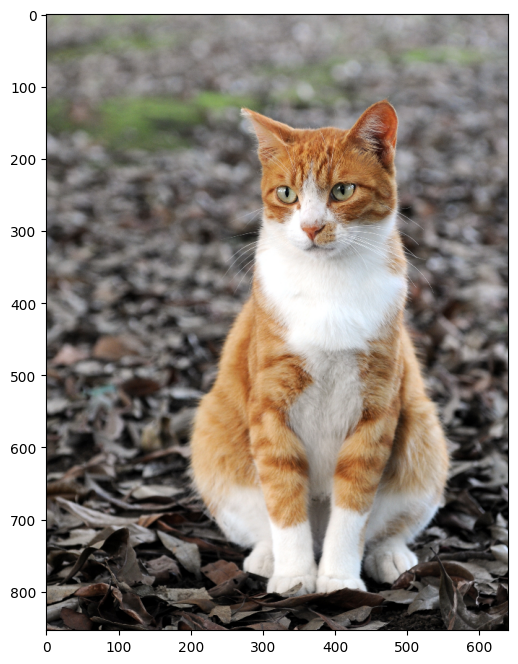

In [2]:
_ = cv2.imread('tabby.jpg')[..., ::-1]
tabby = cv2.resize(_, dsize=None, fx=0.3, fy=0.3)
plt.subplots(1,1,figsize=(8,8))[1].imshow(tabby);

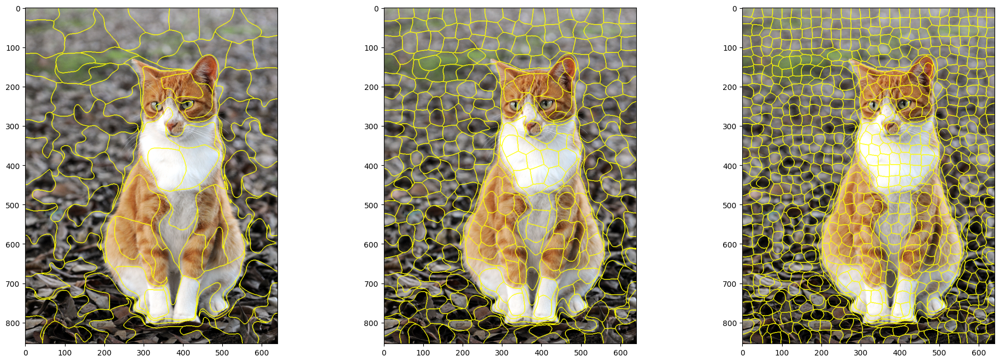

In [7]:
n = [100, 400, 900]
sigma = 10
plt.subplots(1,3,figsize=(24,8))
for i, n_segments in enumerate(n):
    segments = slic(tabby, n_segments=n_segments, sigma=sigma)
    plt.subplot(1,3,i+1)
    plt.imshow(mark_boundaries(tabby, segments))

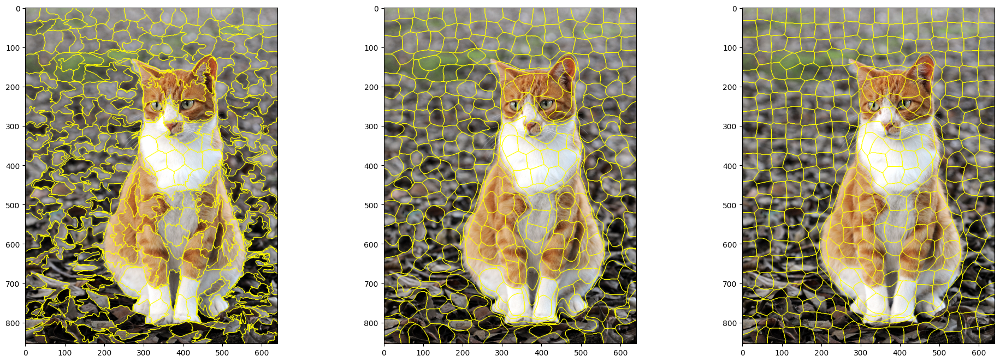

In [10]:
n = 400
sigmas = [1, 10, 20]
plt.subplots(1,3,figsize=(24,8))
for i, sigma in enumerate(sigmas):
    segments = slic(tabby, n_segments=n, sigma=sigma)
    plt.subplot(1,3,i+1)
    plt.imshow(mark_boundaries(tabby, segments))

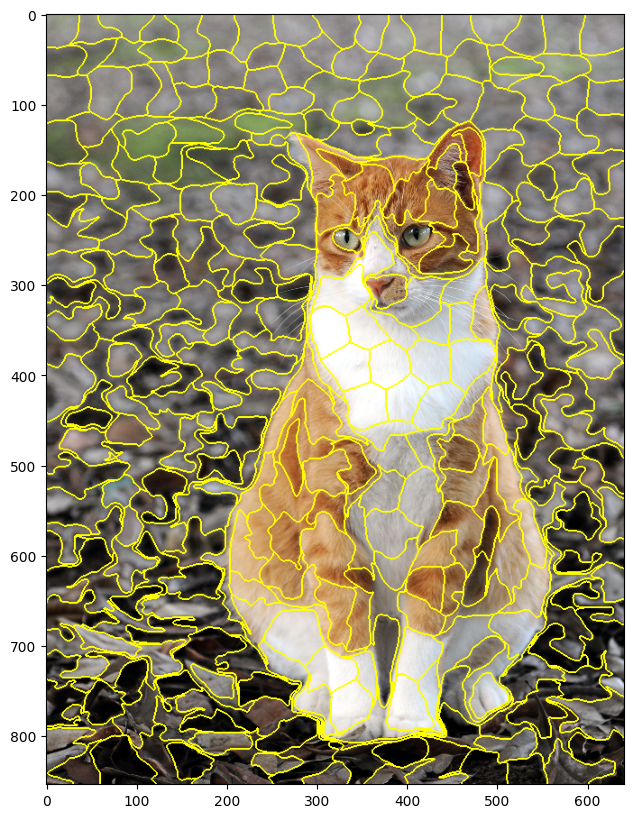

In [3]:
n = 400
sigma = 3
plt.figure(figsize=(20,10))
plt.imshow(mark_boundaries(tabby, slic(tabby, n_segments=n, sigma=sigma)))

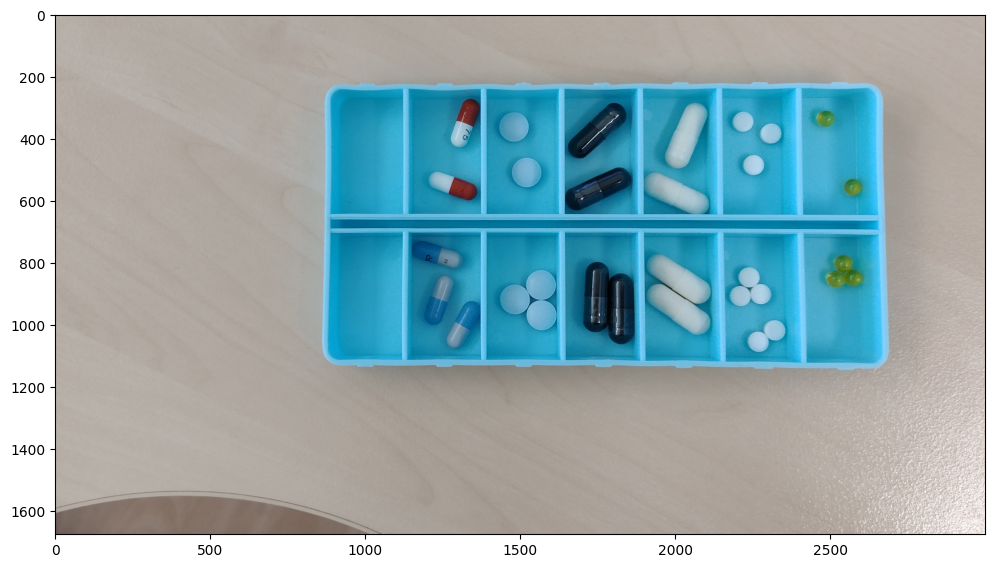

In [2]:
pills = cv2.imread('pills.png')[..., ::-1]
plt.subplots(1,1,figsize=(12,8))[1].imshow(pills);

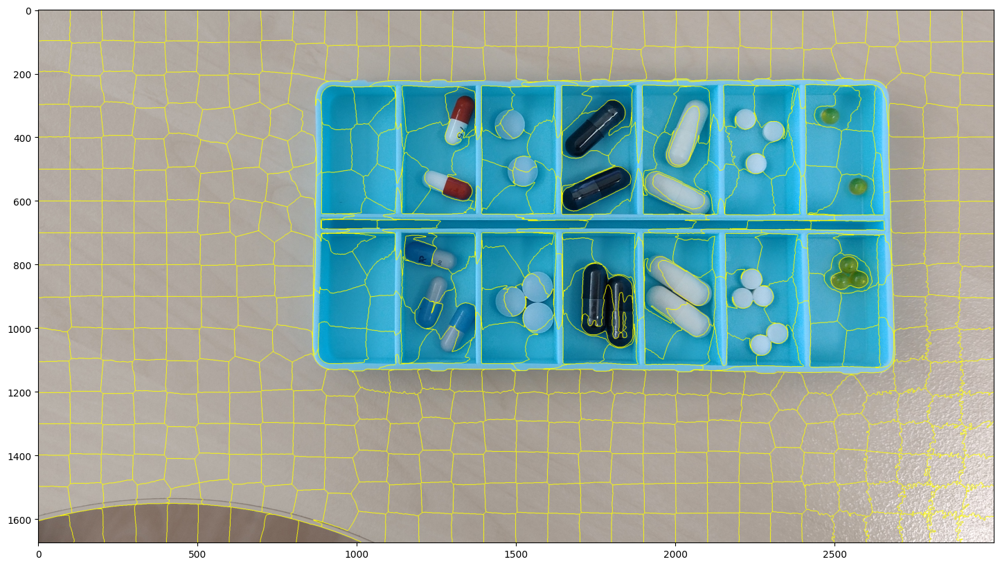

In [ ]:
n = 500
sigma = 2
comp = 10
plt.figure(figsize=(20,10))
plt.imshow(mark_boundaries(pills, slic(pills, n_segments=n, sigma=sigma, compactness=comp)))

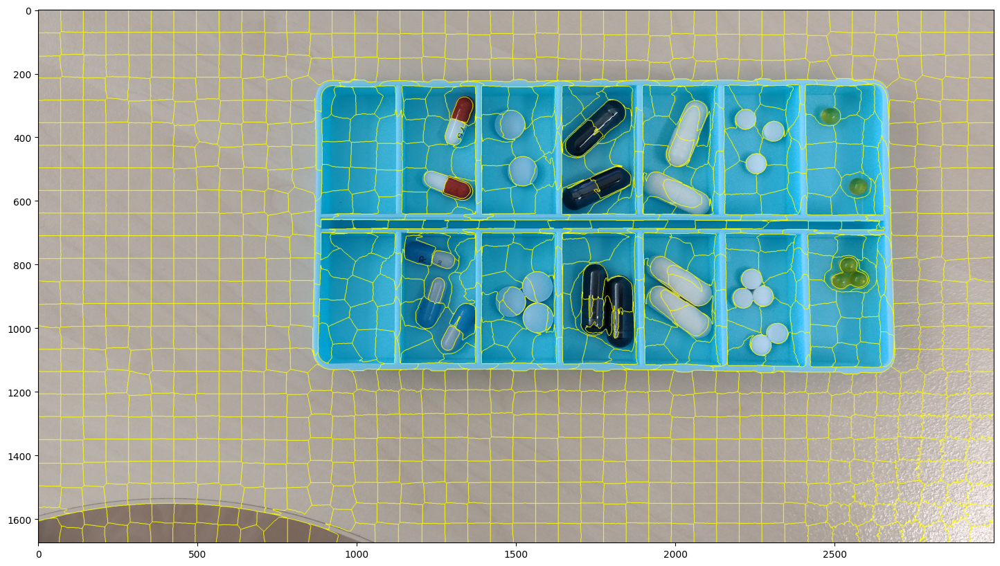

In [6]:
n = 1000
sigma = 2
comp = 10
plt.figure(figsize=(20,10))
plt.imshow(mark_boundaries(pills, slic(pills, n_segments=n, sigma=sigma, compactness=comp)))

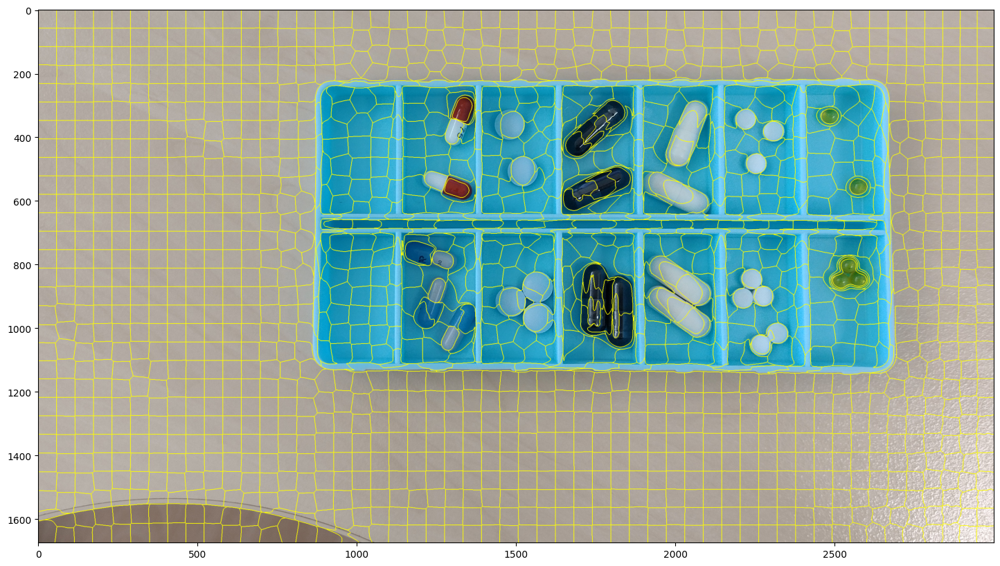

In [9]:
n = 1500
sigma = 5
comp = 10
plt.figure(figsize=(20,10))
plt.imshow(mark_boundaries(pills, slic(pills, n_segments=n, sigma=sigma, compactness=comp)))

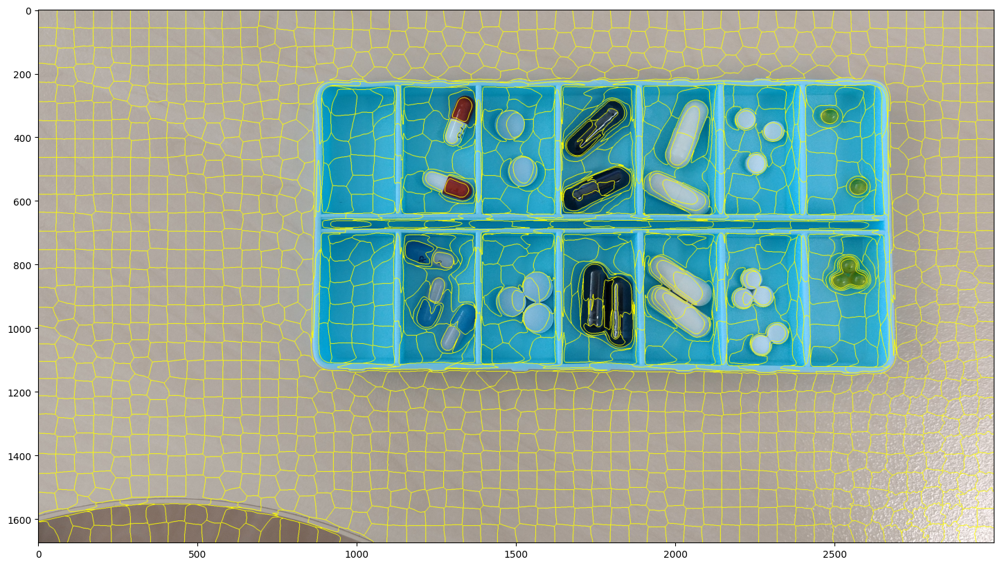

In [164]:
n = 1500
sigma = 5
comp = 5
plt.figure(figsize=(20,10))
plt.imshow(mark_boundaries(pills, slic(pills, n_segments=n, sigma=sigma, compactness=comp)))

In [6]:
image = pills

segments = slic(image, n_segments=400, compactness=10, sigma=5)

num_segments = np.max(segments) + 1
features = np.zeros((num_segments, 3))

for i in range(num_segments):
    mask = segments == i
    if np.any(mask): 
        features[i] = np.mean(image[mask], axis=0)

k = 2 
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)
_, labels, _ = cv2.kmeans(features.astype(np.float32), k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

background_mask = np.zeros(segments.shape, dtype=np.uint8)
for i in range(num_segments):
    background_mask[segments == i] = labels[i]

count_0 = np.sum(background_mask == 0)
count_1 = np.sum(background_mask == 1)

new_mask = np.zeros_like(background_mask)

if count_1 > count_0:
    new_mask[background_mask == 0] = 1
    new_mask[background_mask == 1] = 0

open_kernel = np.ones((1, 1), np.uint8) 

opened_mask = cv2.morphologyEx(new_mask, cv2.MORPH_CLOSE, open_kernel)


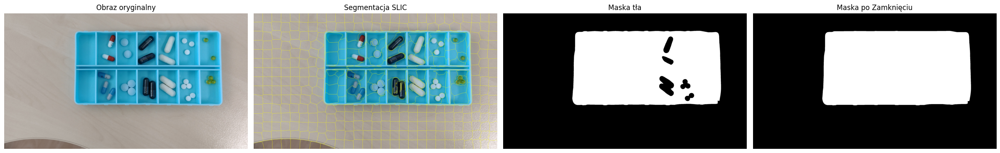

In [4]:
open_kernel = np.ones((100, 100), np.uint8) 

opened_mask = cv2.morphologyEx(new_mask, cv2.MORPH_CLOSE, open_kernel)

fig, ax = plt.subplots(1, 4, figsize=(24, 6))
ax[0].imshow(image)
ax[0].set_title('Obraz oryginalny')
ax[0].axis('off')

ax[1].imshow(mark_boundaries(image, segments))
ax[1].set_title('Segmentacja SLIC')
ax[1].axis('off')

ax[2].imshow(new_mask, cmap='gray')
ax[2].set_title('Maska tła')
ax[2].axis('off')

ax[3].imshow(opened_mask, cmap='gray')
ax[3].set_title('Maska po Zamknięciu')
ax[3].axis('off')

plt.tight_layout()
plt.show()


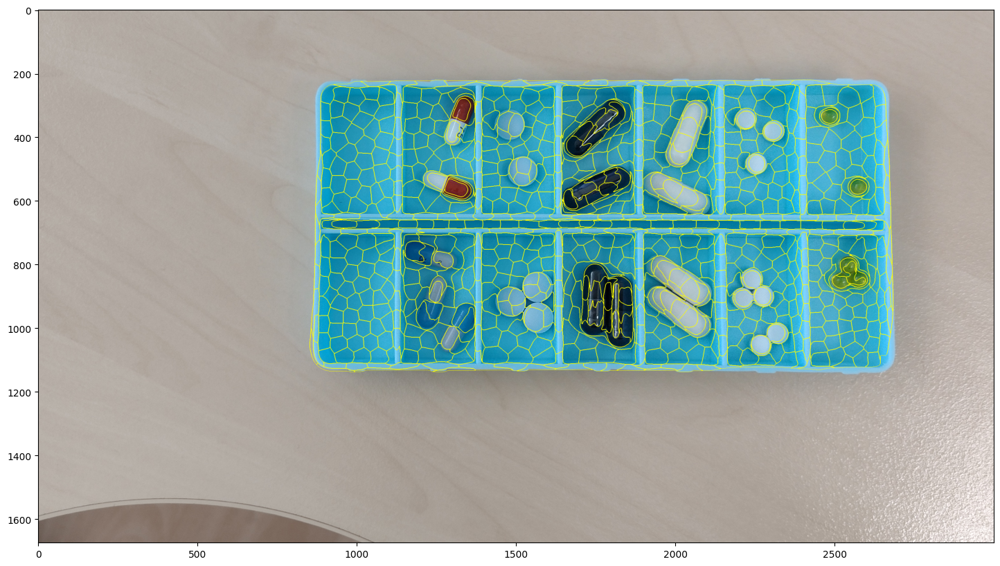

In [9]:
segments = slic(image, n_segments=900, compactness=5, sigma=5, mask=opened_mask)
plt.figure(figsize=(20,10))
plt.imshow(mark_boundaries(image, segments))

#### Zadanie 2

Dla obrazu `tabby` wykonaj post-processing segmentacji SLIC by uzyskać dwa jednorodne obszary: jeden zawierający wyłącznie kota, drugi zawierający wyłącznie tło.

Można to zadanie potraktować jako binaryzację na poziomie superpikseli i zrealizować je za pomocą progowania. 
Można też potraktować je jako klasteryzację superpikseli i wykorzystać np. [`cv2.kmeans`](https://docs.opencv.org/4.x/d5/d38/group__core__cluster.html#ga9a34dc06c6ec9460e90860f15bcd2f88).  
Niezależnie od wybranej ścieżki, konieczne będzie opisanie każdego z superpikseli za pomocą jakiejś *cechy* go opisującej (lub kilku cech). Najprostszymi cechami mogą być np. średnie wartości składowych barwy pikseli wchodzących w skład superpiksela.  
Do zastanowienia: jakie parametry SLICa wybrać jako podstawę w tym zadaniu?

Zaprezentuj wyniki albo za pomocą `mark_boundaries` albo wyświetlając maskę binarną.

---

NumPy pro-tip: aby uzyskać zbiór wszystkich pikseli obrazu o wartości np. 3 możesz użyć notacji: ```obraz==3```. Wynikiem jest macierz boolowska, której można używać jako selektor. Np. aby na obrazie `A` wyzerować wszystkie piksele, którym w obrazie `B` odpowiada wartość 5, możesz napisać:  
```A[B==5] = 0```  
Ten zapis jest **znacznie** szybszy niż manualne iterowanie po obrazach i sprawdzanie warunków if-ami.

---

Przykładowe użycie `cv2.kmeans` (więcej możesz poczytać np. [tutaj](https://opencv24-python-tutorials.readthedocs.io/en/latest/py_tutorials/py_ml/py_kmeans/py_kmeans_opencv/py_kmeans_opencv.html)):
```python
c, labels, centers = cv2.kmeans(
    data=data,  # np.ndarray typu float o wymiarach NxK gdzie N to liczba sampli (u nas: superpikseli), K - liczba cech
    K=2,        # oczekiwana liczba klastrów
    bestLabels=None,
    criteria=(cv2.TERM_CRITERIA_EPS, 10, 1.0),  # przykładowe kryteria stopu
    attempts=1, # liczba powtórzeń algorytmu
    flags=cv2.KMEANS_RANDOM_CENTERS  # sposób inicjalizacji klastrów
)
```

Funkcja ta zwraca krotkę, której najważniejszym komponentem jest ten drugi (tu: `labels`), tj. macierz o wymiarach Nx1, zawierająca indeks klastra przypisanego i-temu samplowi.

In [165]:
# zacznij od przygotowania macierzy wejściowej (data) reprezentującej superpiksele jako punkty danych

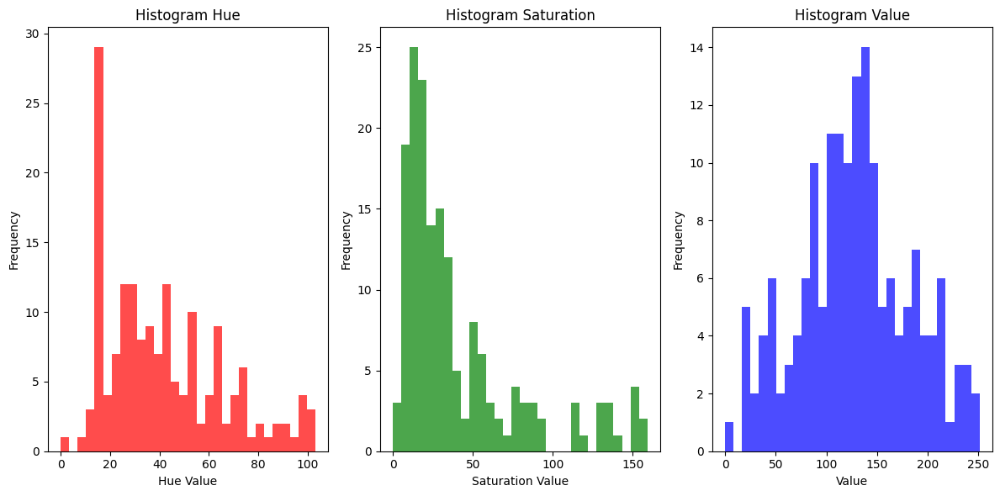

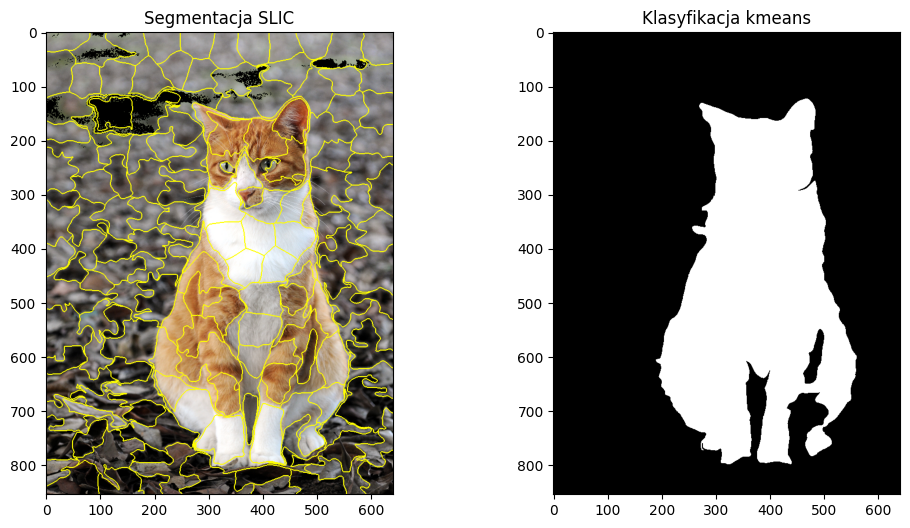

In [185]:
image = tabby 

hsv_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)

lower_green = np.array([40, 40, 40])  
upper_green = np.array([80, 255, 255])  

mask_green = cv2.inRange(hsv_image, lower_green, upper_green)

masked_image = cv2.bitwise_and(image, image, mask=~mask_green)

segments = slic(masked_image, n_segments=200, compactness=15, sigma=3)

num_segments = np.max(segments) + 1
features = np.zeros((num_segments, 3))

for i in range(num_segments):
    mask = segments == i
    if np.any(mask): 
        features[i] = np.mean(hsv_image[mask], axis=0)

valid_features = ~np.isnan(features).any(axis=1)
features = features[valid_features]

plt.figure(figsize=(12, 6))

plt.subplot(1, 3, 1)
plt.hist(features[:, 0], bins=30, color='red', alpha=0.7)
plt.title('Histogram Hue')
plt.xlabel('Hue Value')
plt.ylabel('Frequency')

plt.subplot(1, 3, 2)
plt.hist(features[:, 1], bins=30, color='green', alpha=0.7)
plt.title('Histogram Saturation')
plt.xlabel('Saturation Value')
plt.ylabel('Frequency')

plt.subplot(1, 3, 3)
plt.hist(features[:, 2], bins=30, color='blue', alpha=0.7)
plt.title('Histogram Value')
plt.xlabel('Value')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

k = 2
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 300, 0.001)

if features.shape[0] > 0:
    _, labels, _ = cv2.kmeans(features.astype(np.float32), k, None, criteria, 10, cv2.KMEANS_PP_CENTERS)

    binary_mask = np.zeros(segments.shape, dtype=np.uint8)
    for i in range(num_segments):
        if valid_features[i]:
            binary_mask[segments == i] = labels[i]


    fig, ax = plt.subplots(1, 2, figsize=(12, 6))
    ax[0].imshow(mark_boundaries(masked_image, segments))
    ax[0].set_title('Segmentacja SLIC')
    ax[1].imshow(binary_mask, cmap='gray')
    ax[1].set_title('Klasyfikacja kmeans')
    plt.show()
else:
    print("Brak ważnych cech do klasteryzacji.")


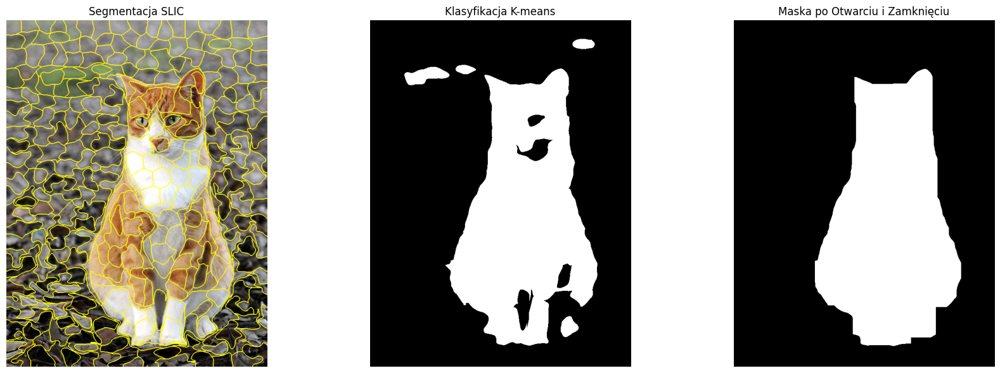

In [341]:
image = tabby 

segments = slic(image, n_segments=400, compactness=10, sigma=5)

hsv_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
num_segments = np.max(segments) + 1
features = np.zeros((num_segments, 3))

for i in range(num_segments):
    mask = segments == i
    if np.any(mask): 
        features[i] = np.mean(hsv_image[mask], axis=0)

k = 2
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 200, 0.1)

_, labels, _ = cv2.kmeans(features.astype(np.float32), k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

binary_mask = np.zeros(segments.shape, dtype=np.uint8)
for i in range(num_segments):
    binary_mask[segments == i] = labels[i]

count_0 = np.sum(binary_mask == 0)
count_1 = np.sum(binary_mask == 1)

new_mask = np.zeros_like(binary_mask)

if count_1 > count_0:
    new_mask[binary_mask == 0] = 1
    new_mask[binary_mask == 1] = 0
    
else:
    new_mask[binary_mask == 0] = 0
    new_mask[binary_mask == 1] = 1

open_kernel = np.ones((40, 5), np.uint8)  
close_kernel = np.ones((65, 50), np.uint8) 

opened_mask = cv2.morphologyEx(new_mask, cv2.MORPH_OPEN, open_kernel)

closed_mask = cv2.morphologyEx(opened_mask, cv2.MORPH_CLOSE, close_kernel)

fig, ax = plt.subplots(1, 3, figsize=(18, 6))
ax[0].imshow(mark_boundaries(image, segments))
ax[0].set_title('Segmentacja SLIC')
ax[0].axis('off')

ax[1].imshow(new_mask, cmap='gray')
ax[1].set_title('Klasyfikacja K-means')
ax[1].axis('off')

ax[2].imshow(closed_mask, cmap='gray')
ax[2].set_title('Maska po Otwarciu i Zamknięciu')
ax[2].axis('off')

plt.tight_layout()
plt.show()


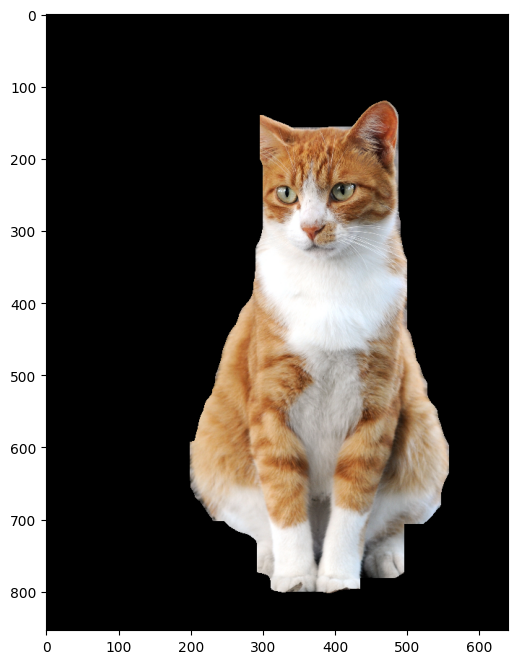

In [342]:
final_output = np.zeros_like(image) 
final_output[closed_mask == 1] = image[closed_mask == 1] 
plt.figure(figsize=(15, 8)) 
plt.imshow(final_output)